In [1]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib

In [2]:
def read_edge_data(graph, system):
    update_data = {}
    for sys in system:
        data = []
        with open(f"log/{sys}/edge.log", "r") as f: 
            for line in f.readlines():
                data.append(line.strip('\n'))

        d = {}
        d = []
        for k in data:
            if(len(k)==0):
                continue
            l = k.split(',')
            l[1] = int(l[1])
            l[4] = int(l[4])
            l[5] = float(l[5])
            d.append(l)
        
        update_data[sys] = {}
        update_data[sys]['insert'] = {}
        update_data[sys]['delete'] = {}
        for item in d:
            if(item[0]==graph and item[1]==1 ):
                update_data[sys][item[3]][item[4]] = item[5]
            
    return update_data

In [3]:
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']

In [4]:
uniform_edge = read_edge_data("uniform-24", upd_system)
orkut_edge = read_edge_data("orkut", upd_system)
#orkut_edge
# uniform_edge

In [5]:
def plot_edge_line(edge_upd, system, operat, save_fig, lbmap):
    x = np.arange(0, 7, 1)
    x_labels = ['1e1','1e2','1e3','1e4','1e5','1e6','1e7']

    fig = plt.figure(figsize=[8, 6], dpi=300)#
    ax = fig.add_subplot(111)
    plt.xticks(x, x_labels)
    plt.yscale('log')
    ax.set_xlabel('Batch size (edges)')
    ax.set_ylabel(f'{lbmap[operat]} Throughput (edges/sec)')
    ax.grid(axis='y', linestyle='--',zorder=0)

    y_update = {}
    for sys in system:
        y_update[sys] = []
        for batch in sorted(edge_upd[sys][operat]):
            y_update[sys].append(edge_upd[sys][operat][batch])
        if(len(y_update[sys])==0):
            for i in range(7):
                y_update[sys].append(0.0)
        plt.plot(x, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')

    ax.legend(ncol=5, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.2, loc=[0, 1])
    plt.savefig(f'data/{save_fig}')

In [6]:
sys_map = {'aspen':{0:'Aspen', 1:'^-'},
           'terrace':{0:'Terrace',1:'s-'},
           'teseo':{0:'Teseo',1:'*-'},
           'risgraph':{0:'RisGraph',1:'D-'},
           'livegraph':{0:'LiveGraph',1:'o-'},
           'graphone':{0:'GraphOne',1:'p-'},
           'llama':{0:'LLAMA',1:'x-'},
           'stinger':{0:'Stinger',1:'v-'},
           'pcsr':{0:'PCSR',1:'.-'},
           'ligra':{0:'CSR',1:'d-'},
           'insert':'Insertion',
           'delete':'Deletion',
           'Read':'Edge',
           '1-HOP':'1-HOP',
           '2-HOP':'2-HOP',
           'BFS':'BFS',
           'PR':'PR'}

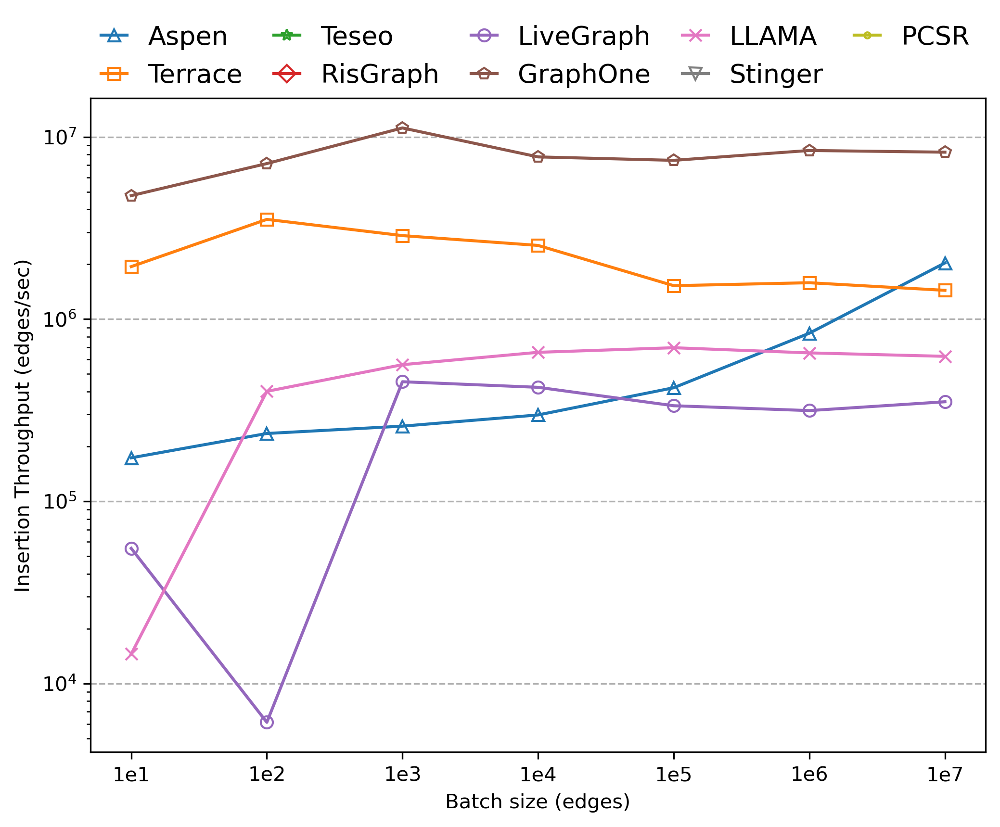

In [7]:
plot_edge_line(uniform_edge, upd_system, "insert", "insert_uniform.png", sys_map)

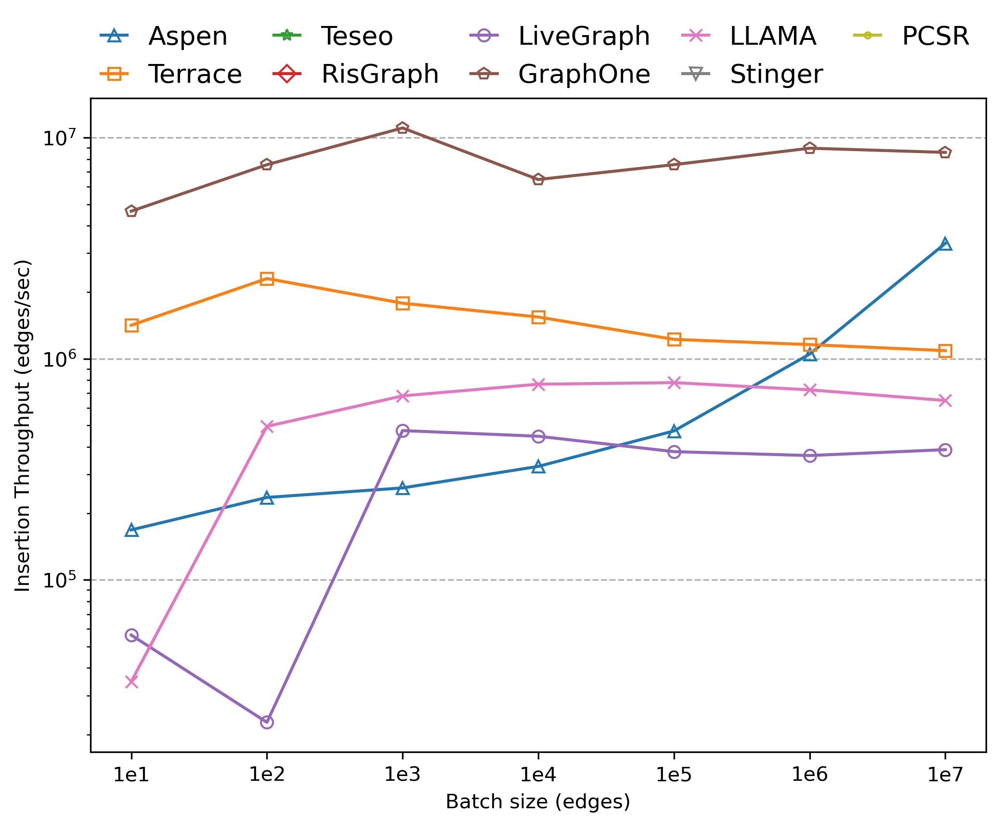

In [8]:
plot_edge_line(orkut_edge, upd_system, "insert", "insert_orkut.png",sys_map)

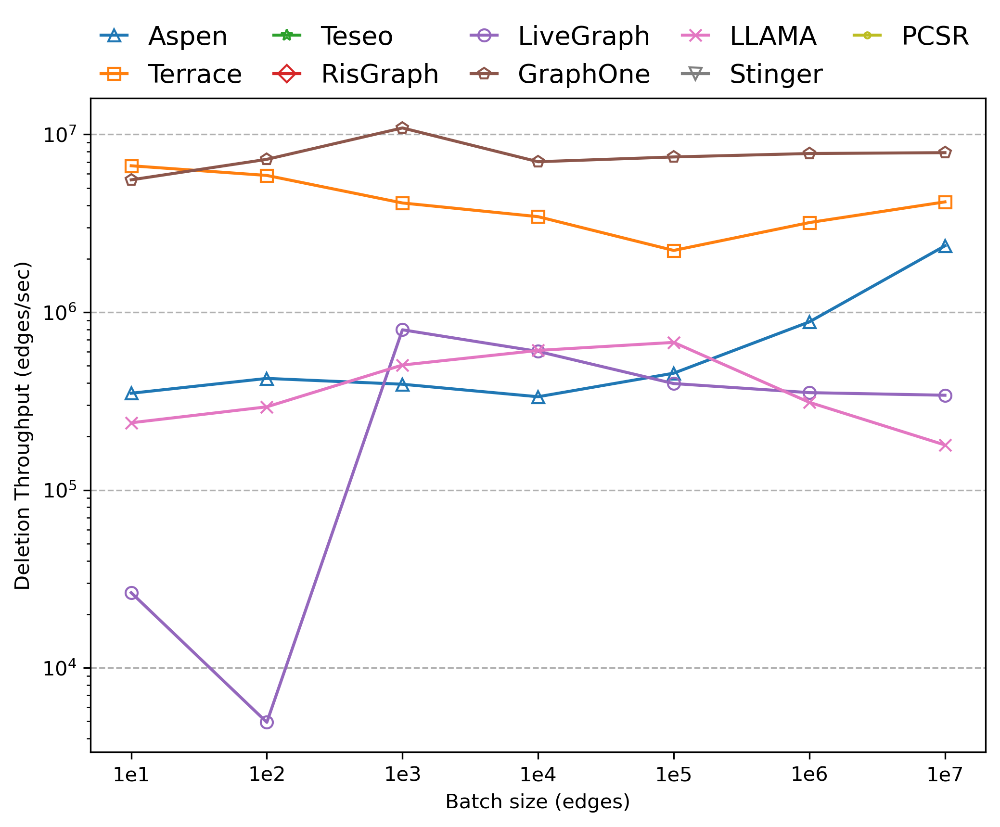

In [9]:
plot_edge_line(uniform_edge, upd_system, "delete", "delete_uniform.png",sys_map)

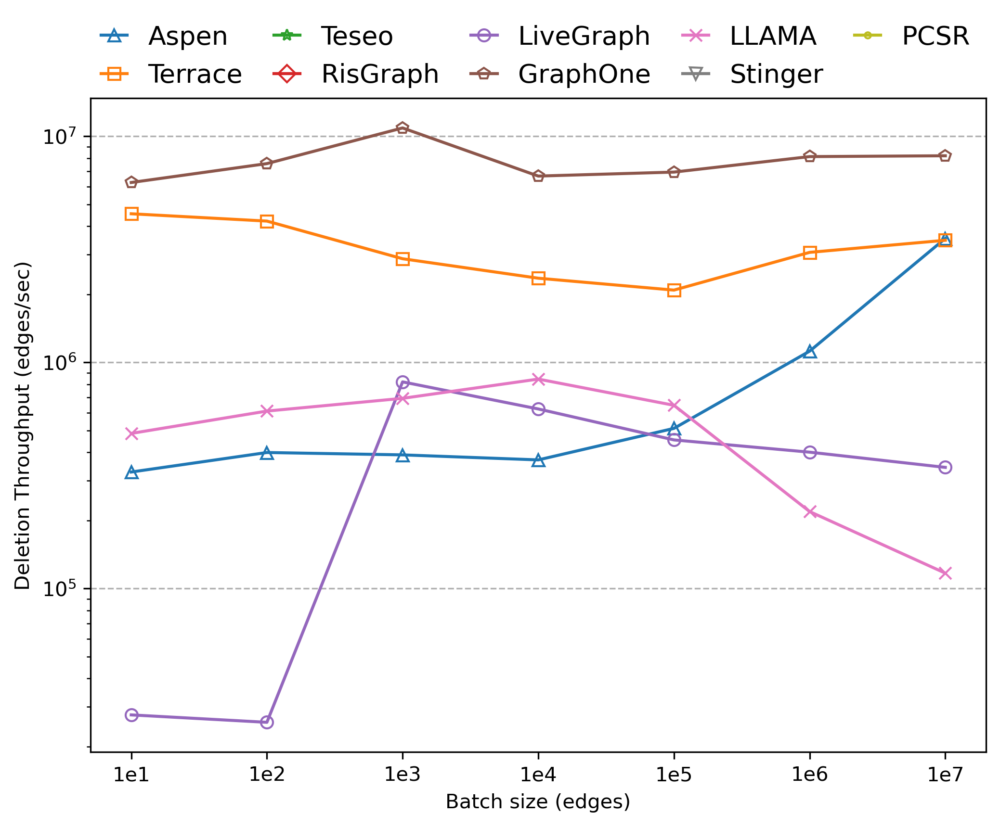

In [10]:
plot_edge_line(orkut_edge, upd_system, "delete", "delete_orkut.png",sys_map)

In [11]:
# orkut_thd_edge = read_thd_edge_data("orkut", upd_system)
# plot_edge_line(orkut_thd_edge, upd_system, "insert", "insert_multhd_orkut.png",sys_map)

In [12]:
# plot_edge_line(orkut_thd_edge, upd_system, "delete", "delete_multhd_orkut.png",sys_map)

In [13]:
# uniform_thd_edge = read_thd_edge_data("uniform-24", upd_system)
# plot_edge_line(uniform_thd_edge, upd_system, "insert", "insert_multhd_uniform.png",sys_map)

In [14]:
# plot_edge_line(uniform_thd_edge, upd_system, "delete", "delete_multhd_uniform.png",sys_map)

### optimal thread

In [15]:
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']

In [16]:
def read_thd_edge_data(graph, system):
    udpate_data = {}
    for sys in system:
        data = []
        with open(f"log/{sys}/edge.log", "r") as f: 
            for line in f.readlines():
                data.append(line.strip('\n'))
        d = {}
        d = []
        for k in data:
            if(len(k)==0):
                continue
            l = k.split(',')
            l[1] = int(l[1])
            l[4] = int(l[4])
            l[5] = float(l[5])
            d.append(l)
        udpate_data[sys] = {}
        udpate_data[sys]['insert'] = {}
        udpate_data[sys]['delete'] = {}
        for item in d:
            if(item[0]==graph and (item[1]==16 or (item[1]==12 and sys=='teseo')or (item[1]==1 and sys=='graphone') )):
                if(item[3] in  udpate_data[sys]):
                    udpate_data[sys][item[3]][item[4]] = item[5]
    return udpate_data

In [162]:
def plot_edge(edge_upd, system, operat, save_fig, lbmap, name, lnum, offset=-1.2):
    x = np.arange(0, 7, 1)
    x_labels = [r'$10^1$',r'$10^2$',r'$10^3$',r'$10^4$',r'$10^5$',r'$10^6$',r'$10^7$']

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    for _ in range(2):
        ax[_].set_xticks(x)
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_yscale('log')
        ax[_].tick_params(axis='y', labelsize=13)
        ax[_].set_xlabel('Batch size', fontsize=13)
        ax[_].grid(axis='y', linestyle='--',zorder=0)
        ax[_].set_ylabel(f'{lbmap[operat[_]]} Throughput', fontsize=15)
        ax[_].set_title(f'{lbmap[operat[_]]} for {name}', 
                        fontsize=18, y=-0.3, fontdict={'family':'Times New Roman'})
        y_update = {}
        for sys in system:
            y_update[sys] = []
            for batch in sorted(edge_upd[sys][operat[_]]):
                y_update[sys].append(edge_upd[sys][operat[_]][batch])
            if(len(y_update[sys])==0):
                for i in range(7):
                    y_update[sys].append(0.0)
            ax[_].plot(x, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
            
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
    plt.legend(ncol=lnum, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.2, loc=[offset, 1])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight')

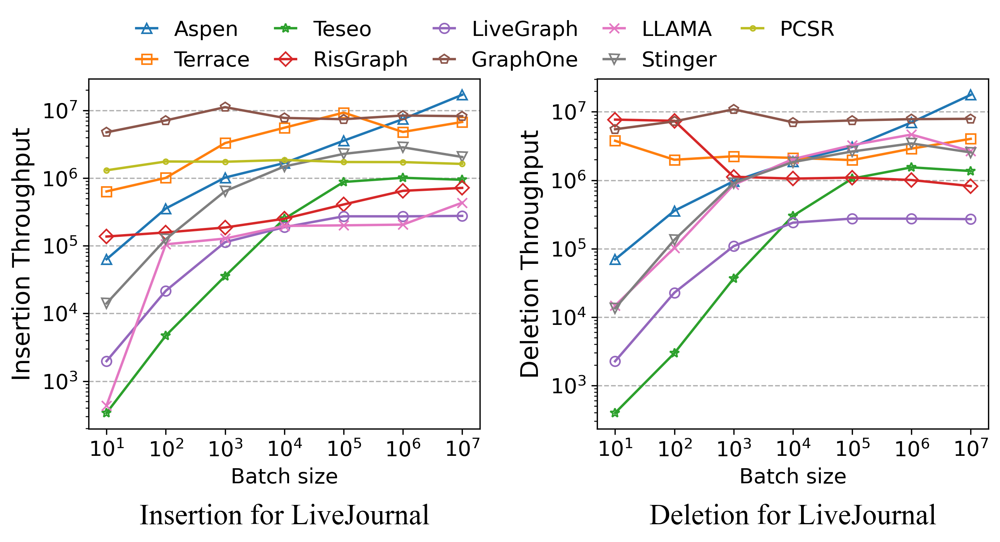

In [163]:
livejournal_thd_edge = read_thd_edge_data("livejournal", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']
plot_edge(uniform_thd_edge, upd_system, ["insert","delete"], "livejournal_upd.pdf",sys_map,'LiveJournal',5)

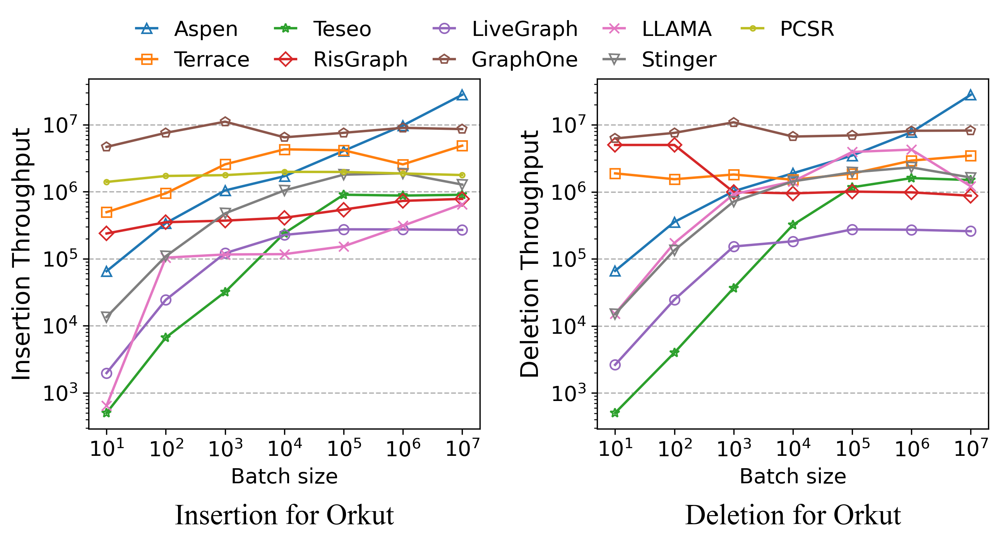

In [164]:
orkut_thd_edge = read_thd_edge_data("orkut", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']
plot_edge(orkut_thd_edge, upd_system, ["insert","delete"], "orkut_upd.pdf",sys_map,'Orkut',5)

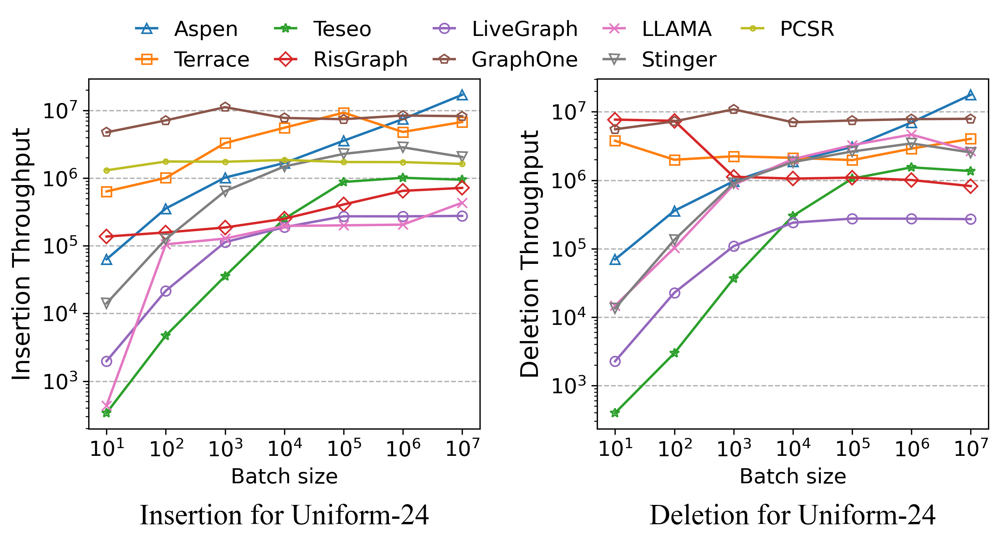

In [165]:
uniform_thd_edge = read_thd_edge_data("uniform-24", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']
plot_edge(uniform_thd_edge, upd_system, ["insert","delete"], "uniform_upd.pdf",sys_map, "Uniform-24",5)

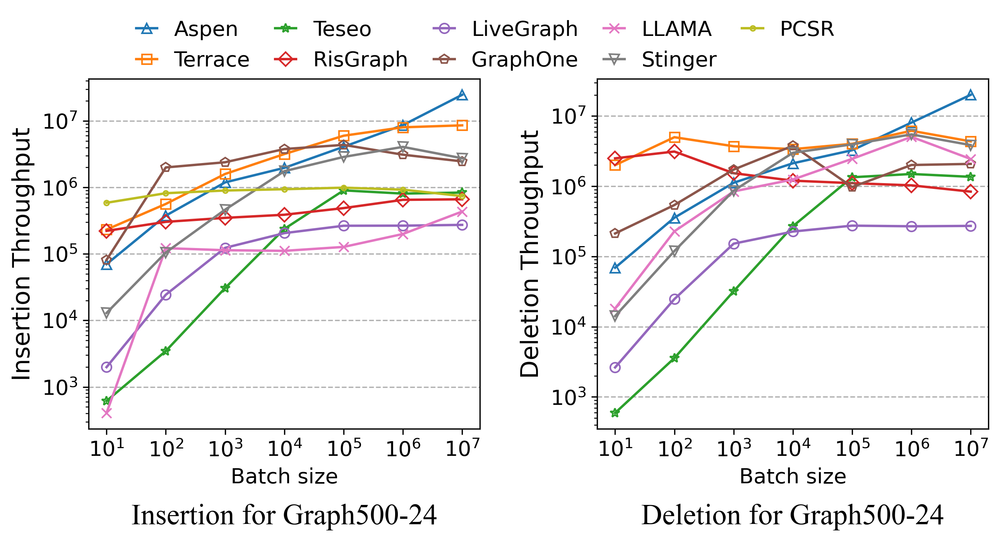

In [166]:
graph500_thd_edge = read_thd_edge_data("graph500-24", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']
plot_edge(graph500_thd_edge, upd_system, ["insert","delete"], "graph500_upd.pdf",sys_map,'Graph500-24',5)

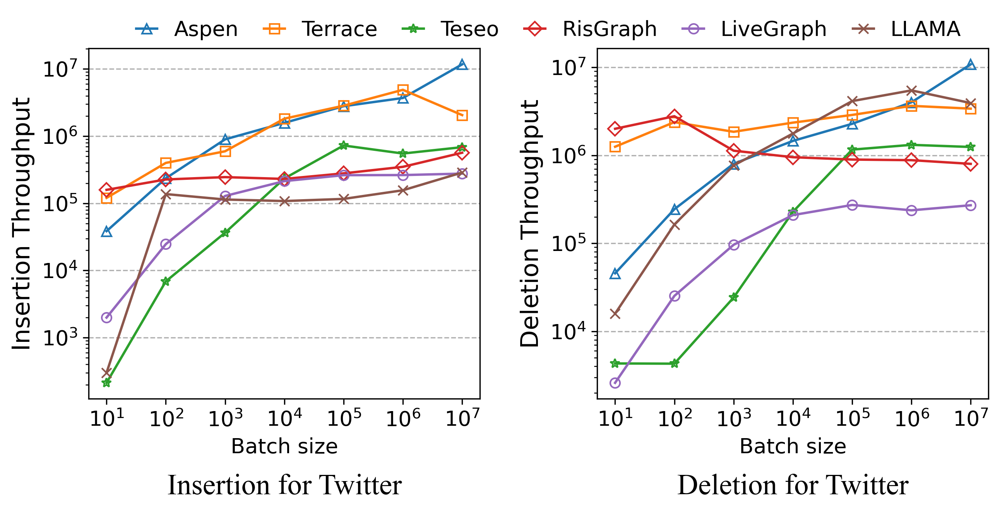

In [167]:
twitter_thd_edge = read_thd_edge_data("twitter", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph','livegraph','llama']
plot_edge(twitter_thd_edge, upd_system, ["insert","delete"], "twitter_upd.pdf",sys_map,'Twitter',6)

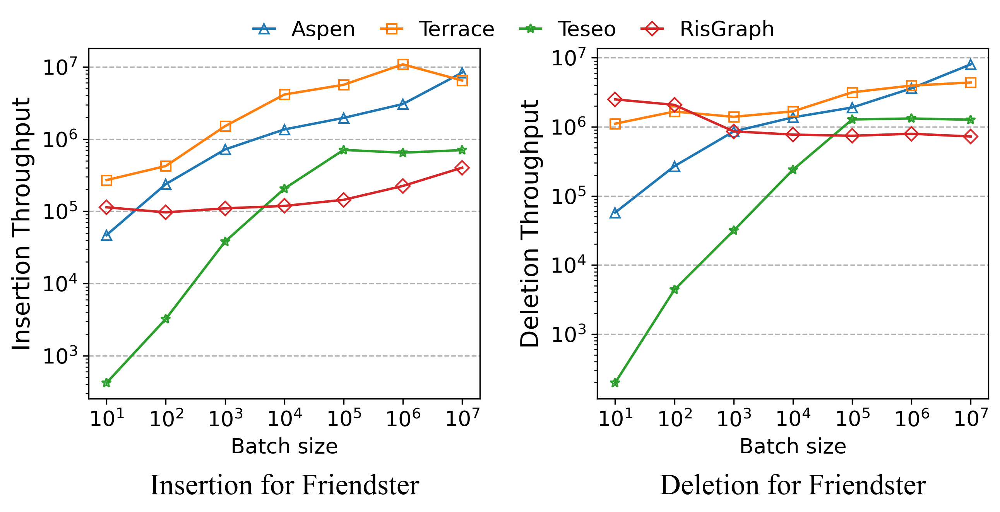

In [170]:
friendster_thd_edge = read_thd_edge_data("friendster", upd_system)
upd_system = ['aspen','terrace','teseo','risgraph']
plot_edge(friendster_thd_edge, upd_system, ["insert","delete"], "friendster_upd.pdf",sys_map,'Friendster',4, -0.9)

In [169]:
def plot_edge_all(edge_data, name, system, operat_S, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 7, 1)
    x_labels = [r'$10^1$',r'$10^2$',r'$10^3$',r'$10^4$',r'$10^5$',r'$10^6$',r'$10^7$']
    iiid = ['(a)','(b)','(c)','(d)']
    fig, ax = plt.subplots(nrows=1, ncols=2*len(edge_data), figsize=(10*len(edge_data), 4), dpi=300)
    _ = 0
    for operat in operat_S:
        for data in edge_data:
            ax[_].set_xticks(x)
            ax[_].set_xticklabels(x_labels, fontsize=13)
            ax[_].set_yscale('log')
            ax[_].tick_params(axis='y', labelsize=13)
            ax[_].set_title(f'{lbmap[operat]} for {name[_%2]}', 
                            fontsize=18, y=-0.3, fontdict={'family':'Times New Roman'})#,'weight':'bold' {iiid[_]} 
            ax[_].set_xlabel(f'Batch Size', fontsize=13)
            ax[_].grid(axis='y', linestyle='--',zorder=0)
#             if(_==0):
            ax[_].set_ylabel(f'Throughput', fontsize=15)

            y_update = {}
            for sys in system:
                y_update[sys] = []
                for batch in sorted(data[sys][operat]):
                    y_update[sys].append(data[sys][operat][batch])
                if(len(y_update[sys])==0):
                    for i in range(7):
                        y_update[sys].append(0.0)
                ax[_].plot(x, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
            _+=1
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
    plt.legend(ncol=9, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[-3.4, 1])# -1.1
    plt.savefig(f'data/{save_fig}',bbox_inches = 'tight')

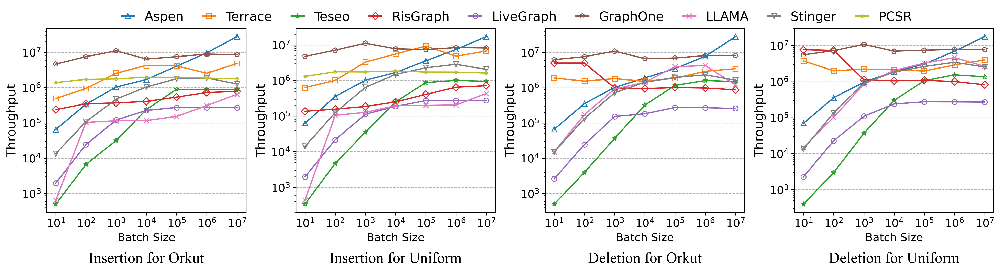

In [21]:
plot_edge_all([orkut_thd_edge, uniform_thd_edge], ['Orkut','Uniform'], upd_system, ["insert","delete"], "all_multhd.pdf",sys_map)

## Alg

In [424]:
def read_alg_data(graph, system):
    udpate_data = {}
    for sys in system:
        data = []
        with open(f"log/{sys}/alg.log", "r") as f: 
            for line in f.readlines():
                data.append(line.strip('\n'))
        d = []
        for k in data:
            if(len(k)==0):
                continue
            l = k.split(',')
            l[3] = float(l[3])
            d.append(l)
        udpate_data[sys] = {}
        for item in d:
            if(item[0]==graph):
                udpate_data[sys][item[2]] = item[3]
    return udpate_data

In [425]:
alg_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr','ligra']
#orkut_alg
# uniform_alg

In [426]:
def plot_read(alg, name, system, t_alg, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, len(t_alg), 1)
    xlabl = [lbmap[xl] for xl in t_alg]
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 5), dpi=300)
    
    for _ in range(0,2):
        y_alg = {}
        for sys in alg[_]:
            y_alg[sys] = []
            for a in t_alg:
                if a in alg[_][sys]:
                    y_alg[sys].append(alg[_][sys][a])
                else:
                    y_alg[sys].append(0.0)

        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=15) 
        ax[_].set_title(f'{name[_]}',fontsize=18, y=-0.25, fontdict={'family':'Times New Roman'})
        ax[_].set_xticklabels(xlabl, fontsize=15)
        ax[_].set_yscale('log')
        #ax[_].set_xlabel(f'{name[_]}', fontsize=15)
        ax[_].set_ylabel('Runnig Time (sec)', fontsize=15)
        ax[_].grid(axis='y', linestyle='--',zorder=0)
        # ax[_].set_ylim(0.05,10)
        width = 0.09
        for i, sys in enumerate(system):
            ax[_].bar(x - (4-i)*width, y_alg[sys], width, edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    
    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[-1.1, 1.05])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight')

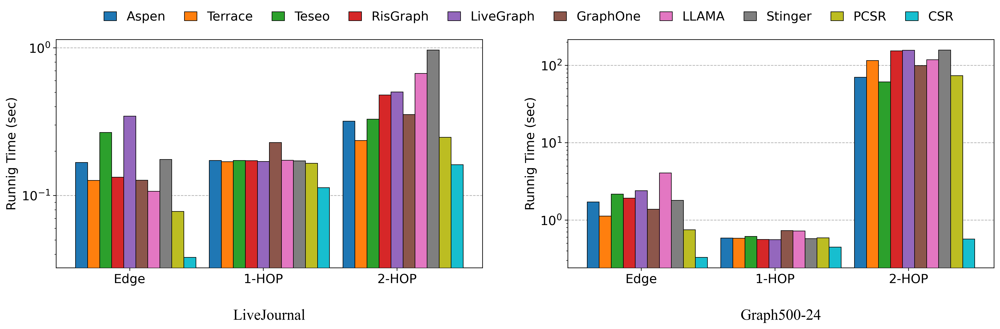

In [427]:
livejournal_alg = read_alg_data('livejournal', alg_system)
graph500_alg = read_alg_data('graph500-24', alg_system)
plot_read([livejournal_alg, graph500_alg],['LiveJournal', 'Graph500-24'], alg_system,['Read','1-HOP','2-HOP'], "LG_read.pdf",sys_map)

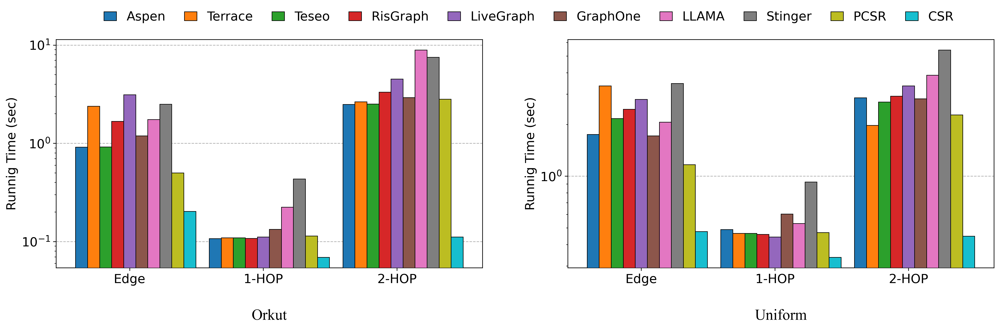

In [428]:
uniform_alg = read_alg_data('uniform-24', alg_system)
orkut_alg = read_alg_data('orkut', alg_system)
plot_read([orkut_alg, uniform_alg],['Orkut', 'Uniform'], alg_system,['Read','1-HOP','2-HOP'], "OU_read.pdf",sys_map)

In [429]:
def plot_TF_read(alg, name, system, sys_data, t_alg, save_fig, lbmap, cl_map):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, len(t_alg), 1)
    xlabl = [lbmap[xl] for xl in t_alg]
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 4), dpi=300)
    y_alg = {}
    for sys in sys_data:
        y_alg[sys] = []
        for a in t_alg:
            if a in alg[sys]:
                y_alg[sys].append(alg[sys][a])
            else:
                pass
                y_alg[sys].append(0.0)

    ax.set_xticks(x)
    ax.tick_params(axis='y', labelsize=15) 
    ax.set_title(f'{name}',fontsize=18, y=-0.25, fontdict={'family':'Times New Roman'})
    ax.set_xticklabels(xlabl, fontsize=15)
    ax.set_yscale('log')
    #ax[_].set_xlabel(f'{name[_]}', fontsize=15)
    ax.set_ylabel('Runnig Time (sec)', fontsize=15)
    ax.grid(axis='y', linestyle='--',zorder=0)
    # ax[_].set_ylim(0.05,10)
    width = 0.12
    for i, sys in enumerate(sys_data):
        ax.bar(x - (len(sys_data)/2-i-1)*width, y_alg[sys], width, color=cl_map[sys],
                  edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    
    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.1, loc=[-0, 1.05])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight')

In [430]:
cl = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
sys = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr','ligra']
cl_map = {}
for i in range(len(cl)):
    cl_map[sys[i]] = cl[i]

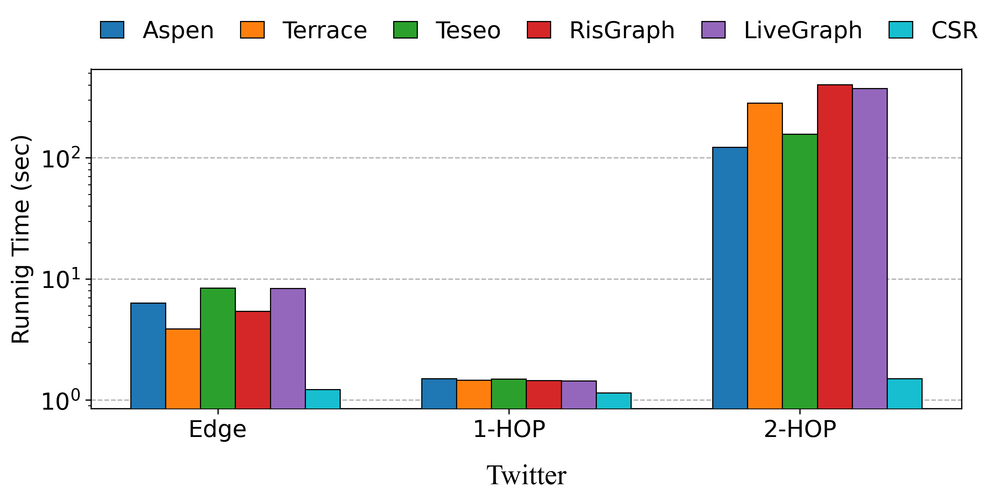

In [431]:
twitter_alg = read_alg_data('twitter', alg_system)
friendster_alg = read_alg_data('friendster', alg_system)
sys_data = [['aspen','terrace','teseo','risgraph','livegraph','ligra'],
            ['aspen','terrace','teseo','risgraph','ligra']]
sys_p = ['aspen','terrace','teseo','risgraph','livegraph','ligra']
plot_TF_read(twitter_alg,'Twitter',sys_p,sys_data[0],['Read','1-HOP','2-HOP'], "twitter_read.pdf",sys_map,cl_map)

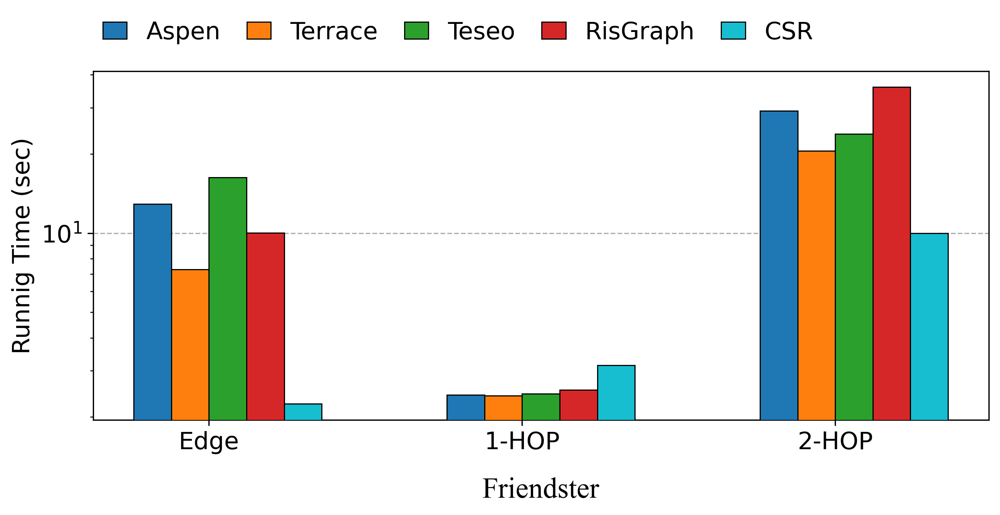

In [432]:
plot_TF_read(friendster_alg,'Friendster',sys_p,sys_data[1],['Read','1-HOP','2-HOP'], "friendster_read.pdf",sys_map,cl_map)

In [433]:
def plot_alg(alg, system, t_alg, save_fig, lbmap):
    y_alg = {}
    for sys in alg:
        y_alg[sys] = []
        for a in t_alg:
            if a in alg[sys]:
                y_alg[sys].append(alg[sys][a])
            else:
                if(a == 'TC'):
                    y_alg[sys].append(10000)
                else :
                    y_alg[sys].append(0)

    x = np.arange(0, len(t_alg), 1)
    fig = plt.figure(figsize=[20, 5], dpi=300)
    ax = fig.add_subplot(111)
    plt.xticks(x, t_alg, fontsize=15)
    plt.yticks(fontsize=15)
   
    plt.yticks([1,10,100,1000,10000],['10^0','10^1','10^2','10^3','>10^4'])
    plt.yscale('log')
    # ax.set_xlabel('Algorithm',fontsize=15)
    ax.set_ylabel('Runnig Time (sec)',fontsize=15)
    ax.grid(axis='y', linestyle='--',zorder=0)
    width = 0.09
    for i, sys in enumerate(system):
        ax.bar(x - (4-i)*width, y_alg[sys], width, edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    #ax.set_yticks(y_alg[sys],[r'>10^4',r'>10^4',r'>10^4',r'>10^4',r'>10^4'])
    ax.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[0.05, 1])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight')

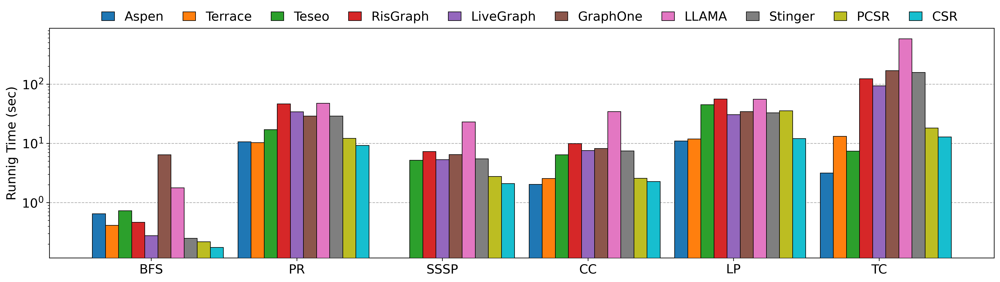

In [434]:
plot_alg(uniform_alg, alg_system,['BFS','PR','SSSP','CC','LP','TC'], "uniform_alg.pdf",sys_map)

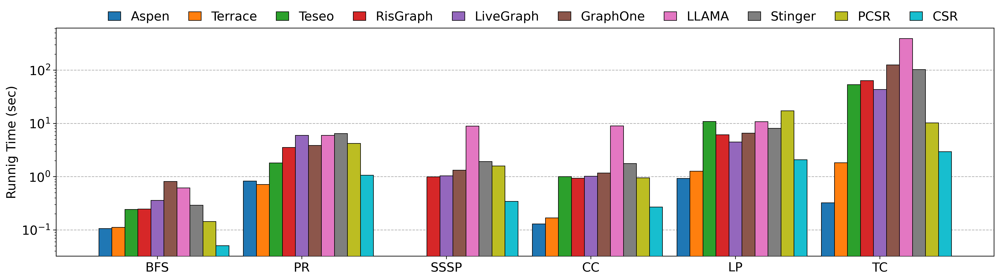

In [435]:
plot_alg(livejournal_alg, alg_system,['BFS','PR','SSSP','CC','LP','TC'], "livejournal_alg.pdf",sys_map)

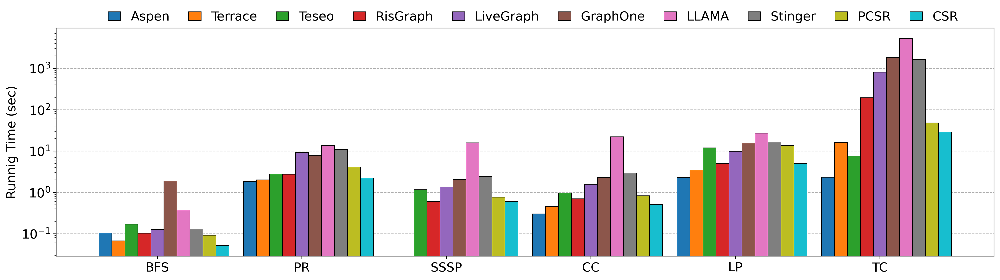

In [436]:
plot_alg(orkut_alg, alg_system,['BFS','PR','SSSP','CC','LP','TC'], "orkut_alg.pdf",sys_map)

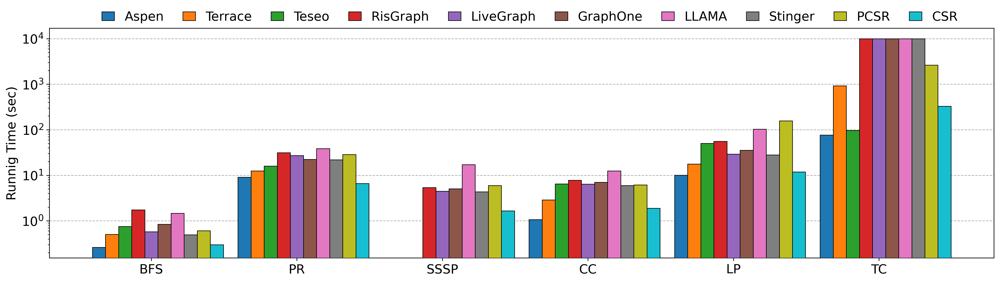

In [437]:
plot_alg(graph500_alg, alg_system,['BFS','PR','SSSP','CC','LP','TC'], "graph500_alg.pdf",sys_map)

In [438]:
def plot_alg2(alg, system, t_alg, save_fig, lbmap, cl_map, off= 0.2):
    y_alg = {}
    for sys in alg:
        y_alg[sys] = []
        for a in t_alg:
            if a in alg[sys]:
                y_alg[sys].append(alg[sys][a])
            else:
                if(a == 'TC'):
                    y_alg[sys].append(10000)
                else :
                    y_alg[sys].append(0)

    x = np.arange(0, len(t_alg), 1)
    fig = plt.figure(figsize=[20, 5], dpi=300)
    ax = fig.add_subplot(111)
    plt.xticks(x, t_alg, fontsize=15)
    plt.yticks(fontsize=15)
    plt.yscale('log')
    # ax.set_xlabel('Algorithm',fontsize=15)
    ax.set_ylabel('Runnig Time (sec)',fontsize=15)
    ax.grid(axis='y', linestyle='--',zorder=0)
    width = 0.13
    for i, sys in enumerate(system):
        ax.bar(x - (3-i)*width, y_alg[sys], width, edgecolor='black', color = cl_map[sys],
               linewidth=0.7, zorder=100, label=lbmap[sys][0])
    ax.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[off, 1])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight')

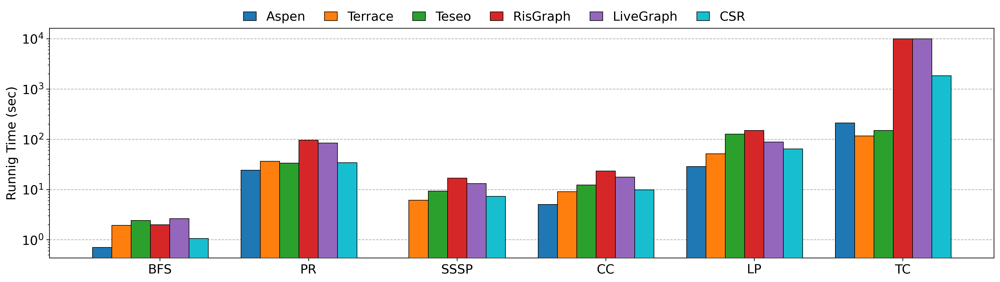

In [439]:
tt_system = ['aspen','terrace','teseo','risgraph','livegraph','ligra']
plot_alg2(twitter_alg, tt_system,['BFS','PR','SSSP','CC','LP','TC'], "twitter_alg.pdf",sys_map,cl_map)

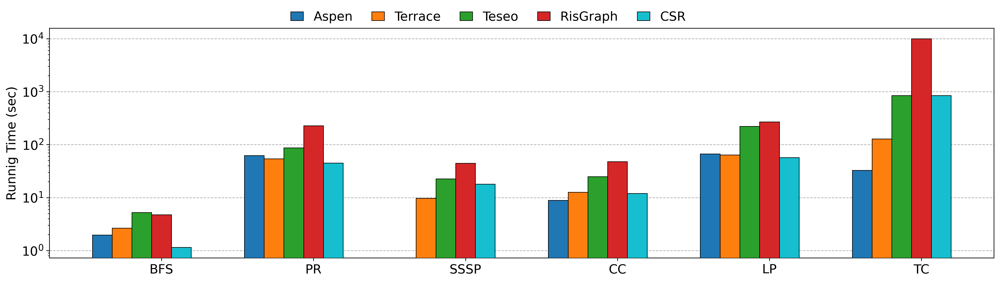

In [440]:
tt_system = ['aspen','terrace','teseo','risgraph','ligra']
plot_alg2(friendster_alg, tt_system,['BFS','PR','SSSP','CC','LP','TC'], "friendster_alg.pdf",sys_map,cl_map,0.25)

In [441]:
def plot_alg_all(alg, name, system, t_alg, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 4), dpi=300)
    
    for _ in range(0,2):
        y_alg = {}
        for sys in alg[_]:
            y_alg[sys] = []
            for a in t_alg:
                if a in alg[_][sys]:
                    y_alg[sys].append(alg[_][sys][a])
                else:
                    y_alg[sys].append(0.0)

        x = np.arange(0, len(t_alg), 1)
        ax[_].set_xticks(x)
        ax[_].set_xticklabels(t_alg, fontsize=15)
        ax[_].tick_params(axis='y', labelsize=15) 
        ax[_].set_yscale('log')
        ax[_].set_title(f'{name[_]}', fontsize=18, y=-0.25, fontdict={'family':'Times New Roman'})
        # ax.set_xlabel('Algorithm',fontsize=15)
        ax[_].set_ylabel('Runnig Time (sec)',fontsize=15)
        ax[_].grid(axis='y', linestyle='--',zorder=0)
        width = 0.09
        for i, sys in enumerate(system):
            ax[_].bar(x - (4-i)*width, y_alg[sys], width, edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    
    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[-1.1, 1])
    plt.savefig(f'data/{save_fig}',bbox_inches = 'tight')

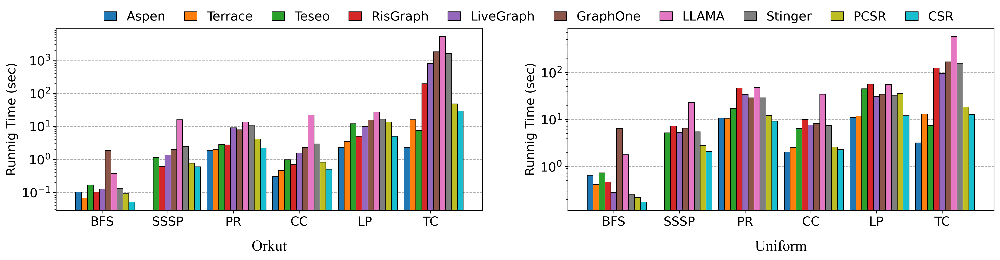

In [442]:
plot_alg_all([orkut_alg,uniform_alg], ['Orkut', 'Uniform'], alg_system,['BFS','SSSP','PR','CC','LP','TC'], "alg.pdf",sys_map)

## Storage

In [443]:
def read_mem_data(system):
    mem_data = {}
    for sys in system:
        data = []
        with open(f"log/{sys}/mem.log", "r") as f: 
            for line in f.readlines():
                data.append(line.strip('\n'))
        d = []
        for k in data:
            if(len(k)==0):
                continue
            l = k.split(',')
            l[1] = float(l[1])
            d.append(l)
        mem_data[sys] = {}
        for item in d:
            mem_data[sys][item[0]] = item[1]
    return mem_data

In [444]:
sys_storage = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr','ligra']
mem = read_mem_data(alg_system)
#mem

In [445]:
def plot_mem(mem, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    y_alg = {}
    t_alg = ['livejournal','orkut','uniform-24','graph500-24','twitter','friendster']
    l_alg = ['LiveJournal','Orkut','Uniform-24','Graph500-24','Twitter','Friendster']
    for sys in mem:
        y_alg[sys] = []
        for a in t_alg:
            if a in mem[sys]:
                y_alg[sys].append(mem[sys][a])
            else:
                y_alg[sys].append(512)

    x = np.arange(0, 6, 1)
    fig = plt.figure(figsize=[20, 4], dpi=300)
    ax = fig.add_subplot(111)
    plt.xticks(x, l_alg, fontsize=15)
    plt.yticks(fontsize=15)
    plt.yscale('log')
    # ax.set_xlabel('Algorithm')
    ax.set_ylabel('Memory Usage (GB)', fontsize=15)
    ax.grid(axis='y', linestyle='--',zorder=0)
    width = 0.09
    for i, sys in enumerate(system):
        ax.bar(x - (4-i)*width, y_alg[sys], width, edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    ax.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[0.05, 1])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight') 

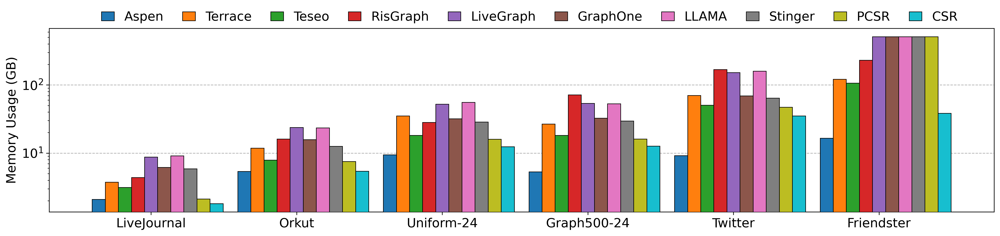

In [446]:
plot_mem(mem, alg_system, "mem.pdf", sys_map)

In [447]:
def plot_mem_frd(mem, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    y_alg = {}
    t_alg = ['friendster']
    l_alg = ['Friendster']
    for sys in mem:
        y_alg[sys] = []
        for a in t_alg:
            if a in mem[sys]:
                y_alg[sys].append(mem[sys][a])
            else:
                y_alg[sys].append(0.0)

    x = np.arange(0, 1, 1)
    fig = plt.figure(figsize=[20, 4], dpi=300)
    ax = fig.add_subplot(111)
    plt.xticks(x, l_alg, fontsize=15)
    plt.yticks(fontsize=15)
    plt.yscale('log')
    # ax.set_xlabel('Algorithm')
    ax.set_ylabel('Memory Usage (GB)', fontsize=15)
    ax.grid(axis='y', linestyle='--',zorder=0)
    width = 0.09
    for i, sys in enumerate(system):
        ax.bar(x - (4-i)*width, y_alg[sys], width, edgecolor='black', linewidth=0.7, zorder=100, label=lbmap[sys][0])
    ax.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.5, loc=[0.05, 1])
    plt.savefig(f'apdx/{save_fig}',bbox_inches = 'tight') 

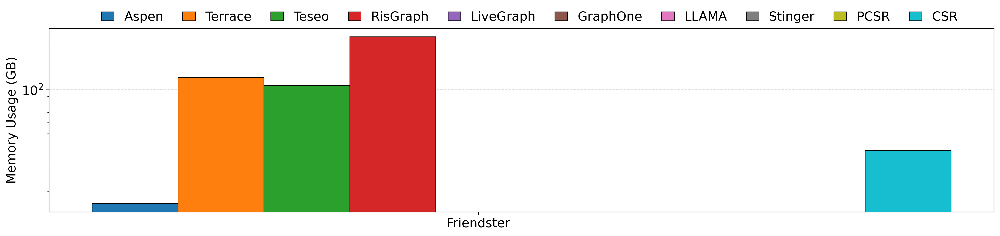

In [448]:
plot_mem_frd(mem, sys_storage, "mem_frd.pdf", sys_map)

## Scalability

### Thread

In [449]:
a_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr','ligra']
s_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger','pcsr']
t_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','llama','stinger']

In [450]:
def read_scala_data(graph, system):
    scala_data = {}
    for sys in system:
        data = []
        with open(f"log/{sys}/scala.log", "r") as f: 
            for line in f.readlines():
                data.append(line.strip('\n'))

        d = []
        for k in data:
            if(len(k)==0):
                continue
            l = k.split(',')
            l[1] = int(l[1])
            if(l[2]=='e'):
                l[5] = float(l[5])
            else :
                l[3] = float(l[3])
            d.append(l)
        
        scala_data[sys] = {}
        for item in d:
            if(item[0]==graph):
                if(item[1] not in scala_data[sys]):
                    scala_data[sys][item[1]] = {}
                if(item[2]=='e'):
                    if(item[3]=='insert' or item[3]=='delete'):
                        scala_data[sys][item[1]][item[3]] = item[5]
                else:
                    scala_data[sys][item[1]][item[2]] = item[3]
    return scala_data

In [451]:
uniform_scla = read_scala_data("uniform-24", a_system)
orkut_scla = read_scala_data("orkut", a_system)
# orkut_scla
# uniform_scla

In [452]:
def plot_scala_thread_e(scala, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 4, 1)
    x_labels = [1,4,8,12]
    tst = ['insert','delete']
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    name = ['Insertion','Deletion']
    for _ in range(2):
        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_title(f'{name[_]}', fontsize=18, y=-0.3, fontdict={'family':'Times New Roman'})
        ax[_].set_ylabel('Speedup', fontsize=15)
        ax[_].set_xlabel('Thread', fontsize=13)
        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for thread in x_labels:
                if(thread in scala[sys]):
                    if(tst[_] in scala[sys][thread]):
                        y_update[sys].append(scala[sys][thread][tst[_]])
                    else :
                        y_update[sys].append(1)
                else :
                    y_update[sys].append(1)
            tmp = y_update[sys][0]
            if(tmp !=0):
                for iy in range(len(y_update[sys])):
                    y_update[sys][iy]/=tmp
            ax[_].plot(x, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')

    plt.legend(ncol=4, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.0, loc=[-0.9, 1.02])
    plt.savefig(f"apdx/{save_fig}_thread.pdf",bbox_inches = 'tight')

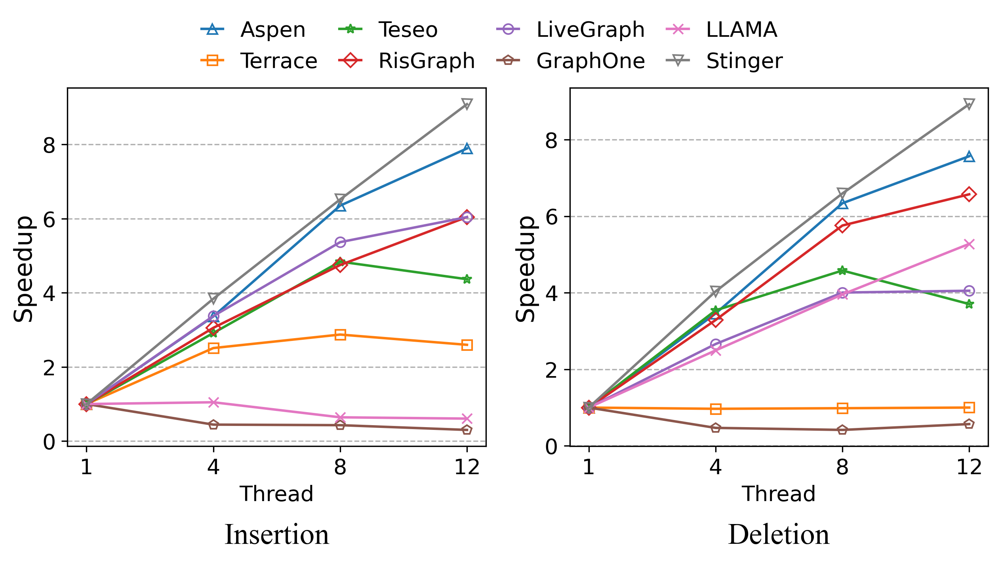

In [453]:
plot_scala_thread_e(orkut_scla, t_system, "orkut_e", sys_map)

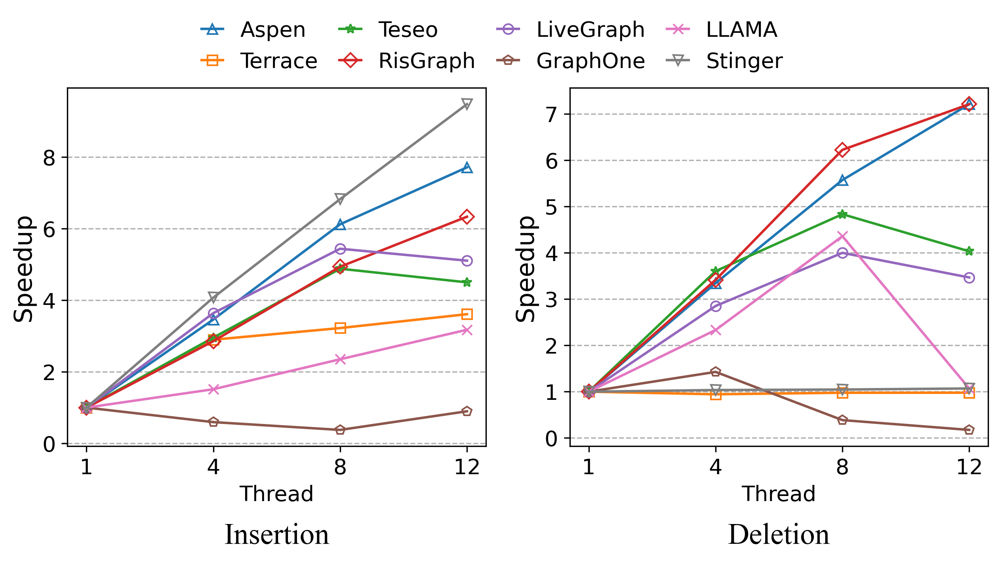

In [454]:
plot_scala_thread_e(uniform_scla, t_system, "uniform_e", sys_map)

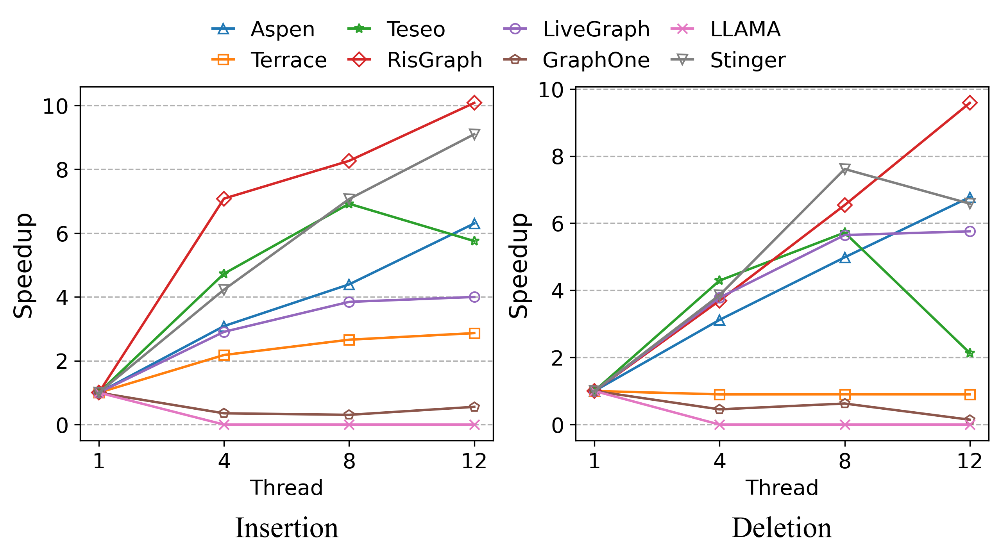

In [455]:
livejournal_scla = read_scala_data("livejournal", a_system)
plot_scala_thread_e(livejournal_scla, t_system, "livejournal_e", sys_map)

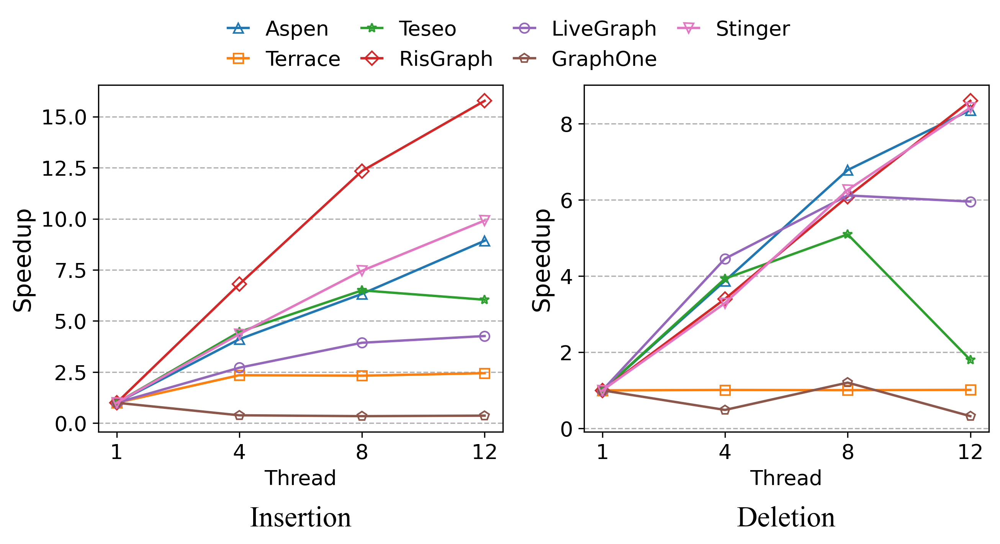

In [243]:
graph500_scla = read_scala_data("graph500-24", a_system)
t_system = ['aspen','terrace','teseo','risgraph','livegraph','graphone','stinger']
plot_scala_thread_e(graph500_scla, t_system, "graph500_e", sys_map)

In [245]:
def plot_scala_thread_line(scala, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 4, 1)
    x_labels = [1,4,8,12]
    
    tst_type = ['Read','1-HOP','2-HOP','BFS','PR']
    
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 3), dpi=300)
    for _, tst in enumerate(tst_type):
        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_yscale('log')
        
        ax[_].set_title(f'{lbmap[tst]}', fontsize=18, y=-0.4, fontdict={'family':'Times New Roman'})
        if(_==0):
            ax[_].set_ylabel('Running Time (sec)', fontsize=15)
        ax[_].set_xlabel('Thread', fontsize=13)

        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for thread in x_labels:
                if(thread in scala[sys]):
                    if(tst in scala[sys][thread]):
                        y_update[sys].append(scala[sys][thread][tst])
                    else :
                        y_update[sys].append(0)
                else :
                    y_update[sys].append(0)
            ax[_].plot(x, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
#     plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.2, loc=[-4.2, 1])
    plt.savefig(f"apdx/{save_fig}_thread.pdf",bbox_inches = 'tight')

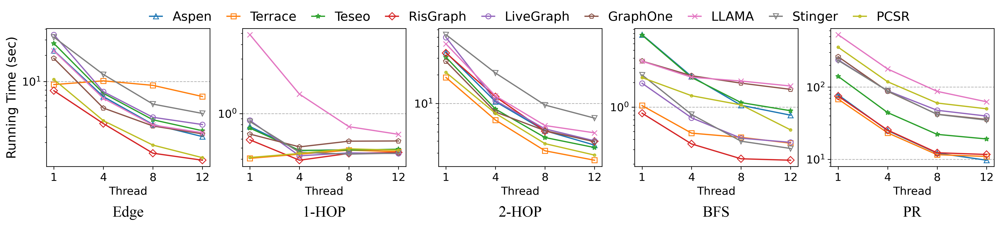

In [246]:
plot_scala_thread_line(uniform_scla, s_system, "uniform_read", sys_map)

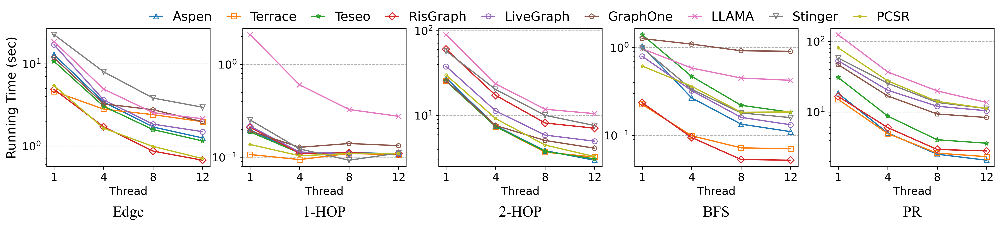

In [247]:
plot_scala_thread_line(orkut_scla, s_system, "orkut_read", sys_map)

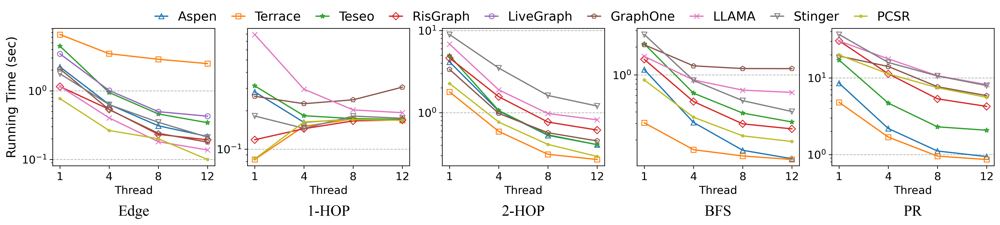

In [248]:
plot_scala_thread_line(livejournal_scla, s_system, "livejournal_read", sys_map)

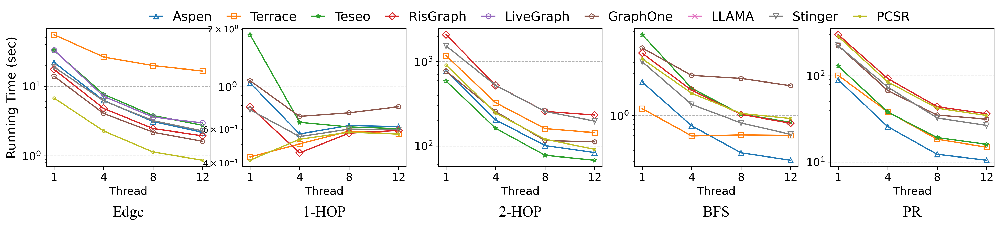

In [249]:
plot_scala_thread_line(graph500_scla, s_system, "graph500_read", sys_map)

### Data

In [44]:
vset = [20,21,22,23,24,25,26]
eset = [10,20,30,40,50,60,70]
data_scala = {}

for v in vset:
    tt = read_scala_data(f"graph_{v}_30", a_system)
    for sys in tt:
        if(sys not in data_scala):
            data_scala[sys] = {}
        if(16 in tt[sys]):
            data_scala[sys][f"graph_{v}_30"] = tt[sys][16]
        if(sys=='teseo'and (12 in tt[sys])):
            if( f"graph_{v}_30" not in data_scala[sys]):
                data_scala[sys][f"graph_{v}_30"] = {}
            data_scala[sys][f"graph_{v}_30"]['e'] = tt[sys][12]['insert']

for e in eset:
    tt = read_scala_data(f"graph_23_{e}", a_system)
    for sys in tt:
        if(sys not in data_scala):
            data_scala[sys] = {}
        if(16 in tt[sys]):
            data_scala[sys][f"graph_23_{e}"] = tt[sys][16]
        if(sys=='teseo'and (12 in tt[sys])):
            data_scala[sys][f"graph_23_{e}"]['e'] = tt[sys][12]['insert']
#data_scala

In [250]:
def plot_scala_data_line(scala, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 7, 1)
    log_x = [20,21,22,23,24,25,26]
    x_labels = [r'$2^{20}$',r'$2^{21}$',r'$2^{22}$',r'$2^{23}$',r'$2^{24}$',r'$2^{25}$',r'$2^{26}$']
    
    tst_type = ['Read','1-HOP','2-HOP','BFS','PR']#,'e'
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 3), dpi=300)
    for _, tst in enumerate(tst_type):
        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_yscale('log')
        ax[_].set_title(f'{lbmap[tst]}', fontsize=18, y=-0.4, fontdict={'family':'Times New Roman'})
        if(_==0):
            ax[_].set_ylabel('Running Time (sec)', fontsize=15)
        ax[_].set_xlabel('Vertex Count', fontsize=13)
        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for logv in log_x:
                if(f"graph_{logv}_30" in scala[sys]):
                    if(tst in scala[sys][f"graph_{logv}_30"]):
                        y_update[sys].append(scala[sys][f"graph_{logv}_30"][tst])
                    else :
                        pass
                        # y_update[sys].append(0)
                else :
                    pass
                    # y_update[sys].append(0)
            xx = np.arange(0, len(y_update[sys]), 1)
            ax[_].plot(xx, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.2, loc=[-4.4, 1])
    
    plt.savefig(f"apdx/vertex_"+save_fig,bbox_inches = 'tight')

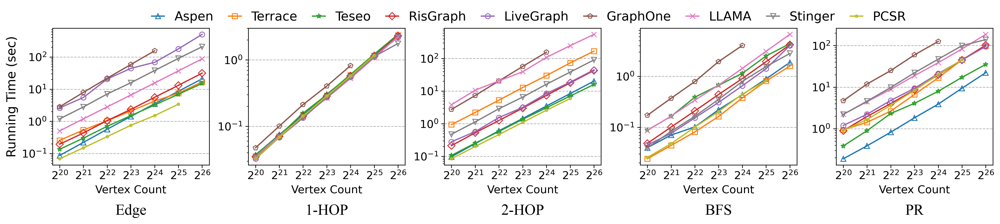

In [251]:
plot_scala_data_line(data_scala, s_system, "alg.pdf", sys_map)

In [254]:
def plot_scala_deg_line(scala, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 7, 1)
    x_labels = [10,20,30,40,50,60,70]
    
    tst_type = ['Read','1-HOP','2-HOP','BFS','PR']#,'e'
    fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 3), dpi=300)
    for _, tst in enumerate(tst_type):
        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_yscale('log')
        if(_==0):
            ax[_].set_ylabel('Running Time (sec)', fontsize=15)
        ax[_].set_xlabel(tst, fontsize=15)
        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for deg in x_labels:
                if(f"graph_23_{deg}" in scala[sys]):
                    if(tst in scala[sys][f"graph_23_{deg}"]):
                        y_update[sys].append(scala[sys][f"graph_23_{deg}"][tst])
                    else :
                        pass
                        # y_update[sys].append(0)
                else :
                    pass
                    # y_update[sys].append(0)
            xx = np.arange(0, len(y_update[sys]), 1)
            ax[_].plot(xx, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')

    plt.legend(ncol=10, prop={ 'size': 15}, frameon=False, handlelength=1, columnspacing=1.2, loc=[-4.2, 1])
    plt.savefig(f"apdx/deg_"+save_fig,bbox_inches = 'tight')

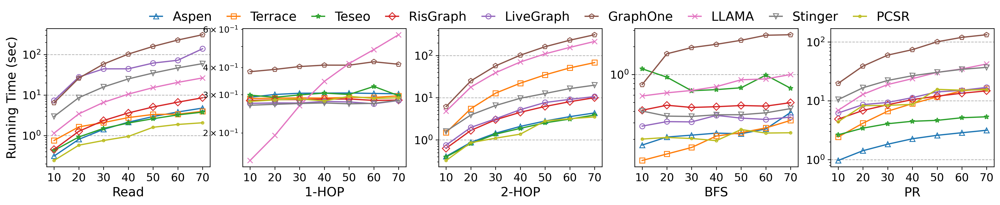

In [255]:
plot_scala_deg_line(data_scala, s_system, "alg.pdf", sys_map)

In [49]:
def plot_sub_scala_deg_line(scala, system, save_fig, lbmap):
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    x = np.arange(0, 7, 1)
    x_labels = [10,20,30,40,50,60,70]
    
    tst_type = ['Read','PR']#,'e'
    name = ['Edge Read','PR']
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    for _, tst in enumerate(tst_type):
        ax[_].set_xticks(x)
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_yscale('log')
        ax[_].set_xlabel(name[_], fontsize=15)
        ax[_].grid(axis='y', linestyle='--',zorder=0)
        if(_==0):
            ax[_].set_ylabel('Running Time (sec)', fontsize=15)
        y_update = {}
        for sys in system:
            y_update[sys] = []
            for deg in x_labels:
                if(f"graph_23_{deg}" in scala[sys]):
                    if(tst in scala[sys][f"graph_23_{deg}"]):
                        y_update[sys].append(scala[sys][f"graph_23_{deg}"][tst])
                    else :
                        pass
                        # y_update[sys].append(0)
                else :
                    pass
                    # y_update[sys].append(0)
            xx = np.arange(0, len(y_update[sys]), 1)
            ax[_].plot(xx, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
    plt.legend(ncol=5, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.0, loc=[-1, 1.02])
    plt.savefig(f"scala/sub_deg_"+save_fig,bbox_inches = 'tight')

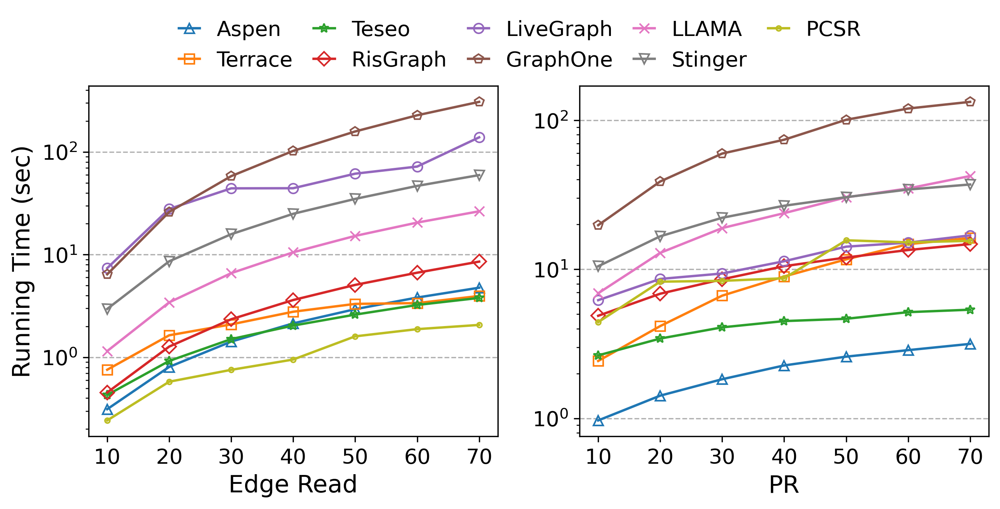

In [50]:
plot_sub_scala_deg_line(data_scala, s_system, "alg.pdf", sys_map)

In [256]:
def plot_scala_vtx_e(scala, system, save_fig, lbmap):
    x = np.arange(0, 7, 1)
    x_labels = [20,21,22,23,24,25,26]
    tst = ['insert','delete']
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    name = ['Insert','Delete']
    for _ in range(2):
        ax[_].set_xticks(x)
        ax[_].set_yscale('log')
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_title(f'{name[_]}', fontsize=18, y=-0.3, fontdict={'family':'Times New Roman'})
        ax[_].set_ylabel('Throughput', fontsize=15)
        ax[_].set_xlabel('Vertex', fontsize=13)
        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for logv in x_labels:
                if(f"graph_{logv}_30" in scala[sys]):
                    if(tst[_] in scala[sys][f"graph_{logv}_30"]):
                        y_update[sys].append(scala[sys][f"graph_{logv}_30"][tst[_]])
                    else :
                        pass
                else :
                    pass
            xx = np.arange(0, len(y_update[sys]), 1)
            ax[_].plot(xx, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
            
    plt.legend(ncol=5, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.0, loc=[-1, 1.02])
    plt.savefig(f"apdx/vertex_"+save_fig,bbox_inches = 'tight')

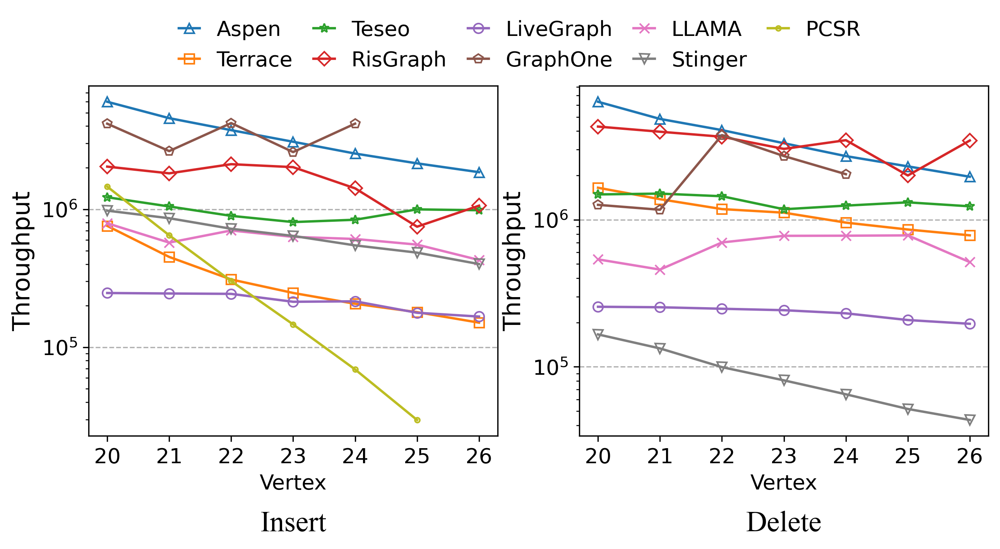

In [257]:
plot_scala_vtx_e(data_scala, s_system, "e.pdf", sys_map)

In [259]:
def plot_scala_deg_e(scala, system, save_fig, lbmap):
    x = np.arange(0, 7, 1)
    x_labels = [10,20,30,40,50,60,70]
    tst = ['insert','delete']
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    name = ['Insert','Delete']
    for _ in range(2):
        ax[_].set_xticks(x)
        ax[_].set_yscale('log')
        ax[_].tick_params(axis='y', labelsize=13) 
        ax[_].set_xticklabels(x_labels, fontsize=13)
        ax[_].set_title(f'{name[_]}', fontsize=18, y=-0.3, fontdict={'family':'Times New Roman'})
        ax[_].set_ylabel('Throughput', fontsize=15)
        ax[_].set_xlabel('Degree', fontsize=13)
        ax[_].grid(axis='y', linestyle='--',zorder=0)

        y_update = {}
        for sys in system:
            y_update[sys] = []
            for deg in x_labels:
                if(f"graph_23_{deg}" in scala[sys]):
                    if(tst[_] in scala[sys][f"graph_23_{deg}"]):
                        y_update[sys].append(scala[sys][f"graph_23_{deg}"][tst[_]])
                    else :
                        pass
                else :
                    pass
            xx = np.arange(0, len(y_update[sys]), 1)
            ax[_].plot(xx, y_update[sys],lbmap[sys][1], label=lbmap[sys][0], markerfacecolor='none')
            
    plt.legend(ncol=5, prop={ 'size': 13}, frameon=False, handlelength=1, columnspacing=1.0, loc=[-1, 1.02])
    plt.savefig(f"apdx/deg_"+save_fig,bbox_inches = 'tight')

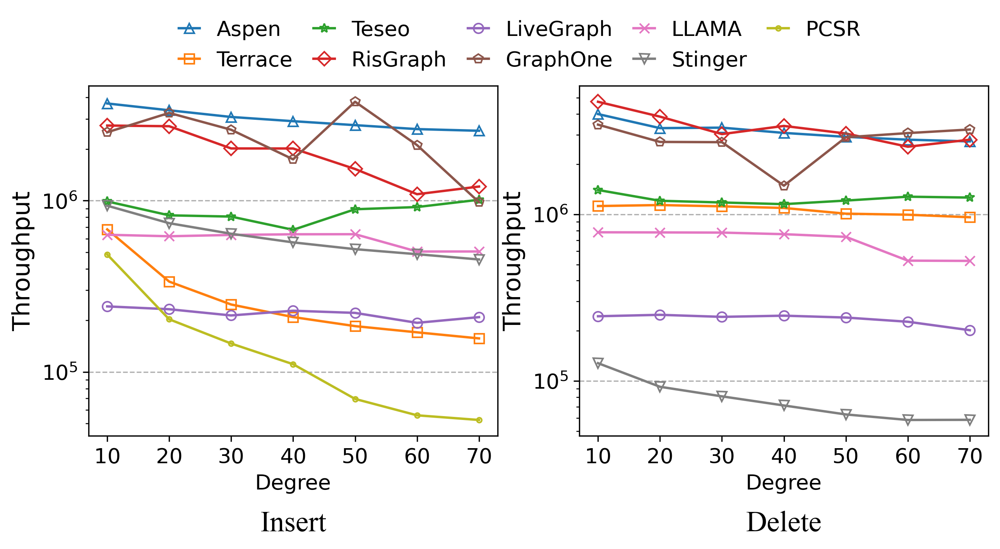

In [260]:
plot_scala_deg_e(data_scala, s_system, "e.pdf", sys_map)

## Other

In [55]:
def kx(x):
    x = round(float(x))
    l = len(str(x))
    x = round(x/10**(l-1),2)
    return str(x)+"E"+str(l-1)
kx('5.62219e+06')

'5.62E6'

In [56]:
s = [" ---+ ",
"------",
" ++  +",
"+ --- ",
"++++++",
"--   -",
"-   +-",
"+ ++- ",
" + + +"]
t=[]
for _ in range(6):
    tmp = '$'
    for ss in s:
        tmp+=ss[_]+'$ & $'
    t.append(tmp)
t

['$ $ & $-$ & $ $ & $+$ & $+$ & $-$ & $-$ & $+$ & $ $ & $',
 '$-$ & $-$ & $+$ & $ $ & $+$ & $-$ & $ $ & $ $ & $+$ & $',
 '$-$ & $-$ & $+$ & $-$ & $+$ & $ $ & $ $ & $+$ & $ $ & $',
 '$-$ & $-$ & $ $ & $-$ & $+$ & $ $ & $ $ & $+$ & $+$ & $',
 '$+$ & $-$ & $ $ & $-$ & $+$ & $ $ & $+$ & $-$ & $ $ & $',
 '$ $ & $-$ & $+$ & $ $ & $+$ & $-$ & $-$ & $ $ & $+$ & $']